# Inferring Chromatin Structure through Bayesian Modeling of Hi-C

Eigenvectors

Gaussian Random Walks for Latent A/B Compartment Assignment — a Pretext to Master PyMC

Søren Jørgensen (Aarhus University)  
September 22, 2025

We present a probabilistic framework for modeling chromatin compartments from Hi-C data, moving beyond the conventional ICE-based eigenvector (E1) thresholding approach. Our approach infers A/B compartment structure using a Bayesian model, allowing each genomic bin to have a probability of belonging to a compartment rather than a hard assignment. We model E1 values as Gaussian distributions with compartment-specific means, and incorporate spatial dependencies via a Gaussian random walk. Applied to macaque and human sperm, the model captures compartment patterns, quantifies uncertainty, and accommodates sparse or noisy data. Comparisons of human chrX and chromosome 8 in X- versus Y-bearing sperm reveal sex-chromosome–linked differences, suggesting potential implications for gene regulation, sperm biology, and the evolutionary dynamics of sex chromosomes. This framework provides a flexible, probabilistic approach to refine compartment boundaries and explore the functional and evolutionary consequences of 3D genome organization.

# Introduction

Chromatin architecture is of high interest in molecular biology, and this interest is increasing in molecular evolution. A high-throughput method for mapping the 3D organization of the genome was proposed by Lieberman-Aiden et al. (2009) and has since been the standard method for inferring chromatin compartments \[@lajoie2015hitchhikersguidehic\]. Briefly, chromatin interactions from Hi-C sequencing are used to generate an interaction matrix of valid Hi-C contacts, and PCA is performed on the covariance matrix of the observed/expected matrix. The following rationale is proposed and experimentally supported: if clustering into two types (A/B compartments), genomic positions that interact will yield a positive value in the covariance matrix, and vice versa for positions that do not interact. Then, when PCA is performed, the first principal component captures the variance that arises from being in different compartments by its sign. The direction of the eigenvector (the sign) is then phased with a biologically relevant measure (such as GC content) to establish that the A compartment is largely the *active* chromatin and B is largely *inactive*.

However, this approach may place too much confidence in the estimation of expected interaction frequencies. By using the eigenvectors within a probabilistic model, where compartment identity is treated as a latent variable, we aim to recover information discarded in hard-labeling based on eigenvector signs. We propose a Bayesian MCMC framework as a spatially aware clustering method that soft-assigns compartments based on the eigendecomposition by assuming that the magnitude of the eigenvector bears relevant biological information.

## Hi-C sequencing, resolution, and up-scaling older Hi-C datasets (CNNs)

There is a prominent limitation to analyzing or reusing published data sets, especially older data sets. The sequencing depth limits the resolution that the Hi-C data can support, and thus, after just a few years, a data set will seem obsolete due to the advances in sequencing technology. Methods have been proposed to up-scale existing data sets \[@zhang2018enhancinghicdata\] with deep convolutional neural networks (in the same way as enhancing the quality of old photos). Instead of up-scaling the raw data, we add an extra step to the classical Hi-C analysis pipeline to quantify the errors when using resolutions that the classical analysis should not support.

## Bayesian Statistics and Modeling

I Bayesian statistics, a prior belief, $P(\theta)$ is combined with the likelihood of observed data, $P(D|\theta)$, to achieve a posterior probability, $P(\theta|D)$, as Bayes’ Theorem formulates in

$$ 
P(\theta | D) = \frac{P(D \ | \ \theta) \ P(\theta)}{P(D)}.
$${#eq-bayes-theorem}

To make a proper probability distribution of the posterior, we use the marginal likelihood,

$$
P(D) =\int P(D \ | \ \theta) \ P(\theta) \ \mathrm{d}\theta,
$${#eq-marginal-likelihood}

which integrates the likelihood over all possible parameter values, weighted by the prior. However, $P(D)$ is often high-dimensional and therefore intractable to evaluate analytically. Consequently, we can estimate **posterior properties** without explicitly computing $P(D)$ by **sampling from the posterior** using *Markov Chain Monte Carlo* (MCMC) methods.

MCMC avoids the daunting integral by constructing a Markov chain \[ref\] with a stationary distribution $P(\theta|D)$. Then, after a burn-in period, the samples, $\theta^{(1)}, \dots, \theta^{(N)}$, can be used to approximate the expectation:

$$
\mathbb{E} \left[ f(\theta) \ | \ D \right] \approx \frac{1}{N}\sum_{i=1}^N f \left ( \theta^{(i)} \right ).
$${#eq-mcmc-expectation}

This approximation enables us to perform inference in models without analytical evaluation.

## Continuing from where we left off

This study builds upon the MSc thesis *Chromatin Compartments and Selection on X* \[@jorgensen2025chromatincompartmentsselection\], in which several methods were developed for Hi-C analysis. Notably, the previous work produced a pipeline to generate eigenvectors from binned Hi-C contact matrices, starting from raw sequencing reads. This pipeline leverages the *Open Chromosome Collective* ecosystem, including *pairtools*, *cooler*, and *cooltools*.

The E1 distributions from the previous study provide the foundation for the current Bayesian model. Visual inspection of these distributions (@fig-e1-dist-50kb) indicates that bins corresponding to A- and B-compartments form two distinct modes—positive for A and negative for B—allowing the probabilistic framework to assign compartments while quantifying uncertainty rather than relying on a hard sign threshold.

``` python
# Histogram of distribution of E1 values (A and B)

x = df["start"].values
y = df["e1"].values

f, ax = plt.subplots()

# A compartments
ax.hist(y[y>0], bins=25, color="tab:red", alpha=0.5, label="A", density=True)
# B compartments
ax.hist(y[y<0], bins=25, color="tab:blue", alpha=0.5, label="B", density=True)
# Mean values (vline)
ax.axvline(y[y>0].mean(), color="tab:red", linestyle="--", label="Mean A")
ax.axvline(y[y<0].mean(), color="tab:blue", linestyle="--", label="Mean B")

# Plot the normal distributions
x_values = np.linspace(y.min(), y.max(), 1000)
mean_a = np.median(y[y>0])
mean_b = np.median(y[y<0])
std_a = y[y>0].std()
std_b = y[y<0].std()

ax.plot(x_values, norm.pdf(x_values, loc=mean_a, scale=std_a), color="tab:red", label="Normal A")
ax.plot(x_values, norm.pdf(x_values, loc=mean_b, scale=std_b), color="tab:blue", label="Normal B")
stacked = norm.pdf(x_values, loc=mean_a, scale=std_a) + norm.pdf(x_values, loc=mean_b, scale=std_b)
ax.plot(x_values, stacked, color="tab:purple", label="Stacked Normals")

# Final touches
plt.xlabel("E1")
plt.ylabel("Density")
plt.legend(loc='best')
plt.tight_layout()
```

    /tmp/ipykernel_2790277/2129628079.py:38: UserWarning: The figure layout has changed to tight
      plt.tight_layout()

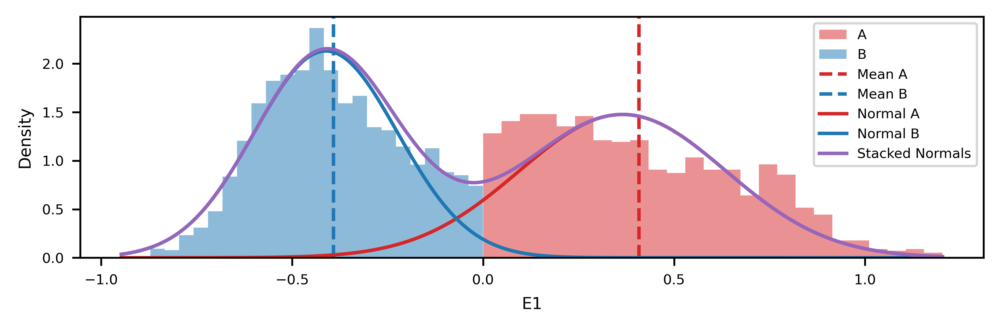

The magnitude of eigenvectors obtained from Principal Component Analysis (PCA), commonly employed to identify A/B chromatin compartments, does not necessarily convey the certainty or strength of compartment assignment. This limitation arises for several reasons.

First, PCA-derived eigenvectors primarily capture correlations between genomic loci rather than the absolute strength of their interactions. While the sign of the eigenvector can classify loci as belonging to either A (active) or B (inactive) compartments, the magnitude does not provide a direct measure of the degree to which a locus associates with its compartment or the intensity of compartmental interactions.

Second, compartmental states are frequently treated as categorical variables, with genomic bins assigned exclusively to A or B. Although this approach is practical for identifying pronounced compartmental switches, it lacks the quantitative resolution necessary to assess intermediate or subtle variations in compartmental association. Quantitative metrics, such as “compartment strength” defined as $\log(\text{AA} \times \text{BB}/\text{AB}^2)$, have therefore been introduced to more accurately capture the segregation between compartments.

Finally, probabilistic approaches offer a more direct estimation of compartmental status. For example, methods such as *CscoreTool* assign to each genomic bin a probability of being in the A compartment. This probabilistic framework offers a quantitative measure that more accurately reflects chromatin accessibility and accounts for uncertainty, thereby highlighting the limitations of interpreting eigenvector magnitude as a definitive indicator of compartment strength.

## Data sets

Macaque data \[@wang2019reprogrammingmeioticchromatin\] was reused and remapped to T2T assembly. The data consist of Hi-C reads from *Macaca mulata* (macaque) in fibroblast and through 4 stages of spermatogenesis. I have previously analyzed this data \[ref\] by remapping it to the most recent *M.* at the time. mulata\* assembly, and quantifying distances to regions of extraordinary selection \[@skov2023extraordinaryselectionhuman\] (Extended Common Haplotypes) on the human X chromosome. This was done at 100kb resolution.

@xu2025threedimensionalgenomestructures has published a single-cell Hi-C data set where they determine each cell to be either X- or Y-bearing (remember, sperm cells are haploid). The authors conclude, after preliminary analysis, that the difference between compartment calls was not varying significantly between the two groups, and thus they were pooled. However, they do not provide a detailed description of how they quantify the variations between the two sets, so it is reasonable to attempt to do so myself. This dataset provides us with two distinct analyses: we can compare the compartment calls between human sperm cells (either pooled or grouped by sex chromosome) and macaque sperm, and we can quantify the difference between compartment calls for autosomal chromosomes in cells that are either X- or Y-bearing.

This could potentially link to sex-chromosome inactivation of autosomes, which is a potential mechanism facilitating meiotic drive.

## Reproducibility

All code, data processing pipelines, and the manuscript are openly available at <https://munch-group.org/hic-compartment-borders>. As in @jorgensen2025chromatincompartmentsselection, reproducibility is at the core of this study, and every step of the analysis can be traced, rerun, and verified through an open and automated workflow:

-   **Version control**: All code and manuscript text are tracked with *git* and hosted on GitHub, providing a complete history of changes and enabling collaborative development.  
-   **Reproducible environments**: Software dependencies are managed through *Conda*, ensuring the identical package versions can be restored on any system.  
-   **Workflow management**: Computational tasks are executed and tracked with *GWF*, guaranteeing analyses are performed in the intended order and are reproducible from raw data to figures.  
-   **Notebooks and documentation**: Analyses are implemented in chronologically ordered *Jupyter Notebooks*. Figures are generated directly within notebooks and embedded into the manuscript via *Quarto*, linking narrative text with the code and data that produced it.  
-   **Publication-friendly output**: A custom *matplotlib* style template provides consistent, accessible, and publication-ready figures without manual editing.  
-   **Self-contained dissemination**: The manuscript, figures, code, and computational environment are bundled and published together with *GitHub Pages* and *Quarto*, yielding a fully reproducible study where readers can trace every result back to its source code and rerun analyses in their own environment.

This approach ensures transparency, minimizes human error, and turns the manuscript into a re-runnable “living document” rather than a static publication.

# Methods

The analysis pipeline developed in @jorgensen2025chromatincompartmentsselection was adapted for the present study. Briefly, raw Hi-C reads were processed using the *Open Chromosome Collective* toolchain (*pairtools*, *cooler*, *cooltools*) to generate normalized contact matrices and eigenvectors. For the single-cell human Hi-C dataset, an additional pooling step was introduced: individual contact maps were merged after grouping cells by sex-chromosome content (*X*- or *Y*-bearing), as determined in the sequencing study.

The pipeline was further updated to support the telomere-to-telomere (T2T) assembly of *Macaca mulata*. Because this assembly is available only through NCBI and not on UCSC servers, custom reference preparation and remapping steps were implemented to ensure compatibility with the pipeline.

## Data generation

### The ICE method

The pipeline developed in @jorgensen2025chromatincompartmentsselection implements the Iterative Correction and Eigenvector decomposition (ICE) method for Hi-C analysis \[@lieberman-aiden2009comprehensivemappinglongrange\]. Raw Hi-C reads are first mapped to the reference genome—GRCh38 for human or T2T-MMU8v1.0 for *Macaca mulatta*—as paired-end reads using *bwa-mem2* with the `-P` option. Valid Hi-C pairs are then parsed and sorted using *pairtools*, followed by deduplication and a quality filter ($\text{mapq} \geq 30$) to remove PCR duplicates and low-quality reads.

Binned interaction matrices (`.cool` files) are generated from the filtered pairs at a base resolution of 1 kb, then recursively coarsened up to 1 Mb bins. Raw interaction matrices often display non-uniform coverage along the genome due to differential restriction enzyme accessibility, sequence composition, or other technical factors. Such high- or low-coverage regions can create artefactual interaction patterns in the matrices. To correct for these *visibility-induced biases*, the ICE normalization procedure balances interaction counts across the genome \[@lajoie2015hitchhikersguidehic\], producing matrices suitable for downstream eigendecomposition and compartment analysis.

The interaction counts of each bin are corrected iteratively until convergence of the coverage, and the correction weight is saved to the cooler. The expected interaction matrix is derived from the decay in contact probability over genomic distance (also, distance decay). It is used to scale the observed interactions before performing eigendecomposition on the correlation matrix of observed/expected. Bins interacting with bins of the same type should keep a positive eigenvector, and vice versa; otherwise, they should keep a negative eigenvector. Thus, the first principal component *should* capture the variance explained by the compartment assignment. The eigenvectors are then oriented to correlate with GC content, ensuring that positive values represent A-compartments and active chromatin, while negative values represent B-compartments and inactive chromatin.

As also described in \[@lajoie2015hitchhikersguidehic\], sometimes there is a larger amount of variance in interaction frequency between chromosome arms than within arms. In these cases, the eigendecomposition will not capture the compartments, but only change its sign at the centromere. Thus, it is generally a safer practice to do the eigendecomposition on the chromosome arms separately, and it is readily implemented into *cooltools* by providing a viewframe to the function that does the calculations. It is not clear how further experimentation with narrowing the eigendecomposition viewframe affects the biological explanation of the results, but it is suggested as a method of obtaining more local compartmentalization \[@wang2019reprogrammingmeioticchromatin\] (termed local PCA). As no centromere was available from the T2T-MMU8v1.0, it was inferred from the largest cluster of satellite repeats, approximately between 57 Mp and 69 Mp (@fig-t2t-satellites). Additionally, the 10Mb viewframe was also applied in the eigendecomposition.

``` python
plot_intervals(satellites, lw=0.3, alpha=1,)
```

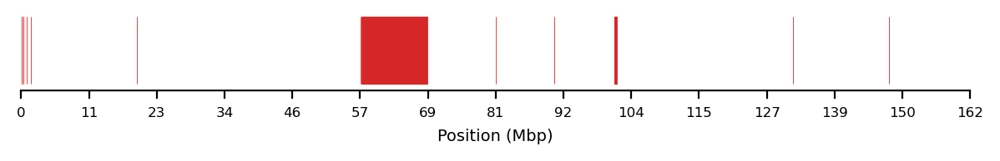

First, the pipeline was applied to generate high-resolution eigenvector tracks on the most recent, telomere-to-telomere *Macaca mulata* assembly, T2T-MMU8v1.0 (GCA_049350105.1), to improve the accuracy of the mapping from the previous study.

Additionally, the pipeline was applied to generate the eigenvectors of human sperm cells harboring the *X* or *Y* chromosome. Although the authors \[@xu2025threedimensionalgenomestructures\] of this Hi-C data report high similarity between sperm cells harboring the *X* or *Y* sex chromosomes, they provide only a brief description of their comparison. Thus, I decided to separate them into two groups to be able to compare autosomal chromatin compartments. A major downside of this is that the coverage is approximately halved, resulting in lower viable resolutions for subsequent analyses. However, eigendecomposition was performed, and a comparative study was performed on autosome eight between X- and Y-bearing cells.

The results of the eigendecomposition are hereafter described as E1 (eigenvector track of the first principal component).

## Modeling

I use PyMC \[@abril-pla2023pymcmoderncomprehensive\] for all modeling, relying as much as possible on functions and built-in functionality for all analyses. I start small in the simplest model possible, then progress to larger and more complex models. The basis of the probabilistic modeling is the assumption that the eigenvectors of A- and B-compartments can be drawn from distinct distributions. I assume that the distributions underlying the compartments are Gaussian with different means, either $\mu_a = 0.5$ or $\mu_b = -0.5$. Additionally, I assume that a probability of being in A can be inferred from the eigenvector, and that a binary latent state can be derived from that to place compartment labels on each bin (I call that `z`).

I experimented with the possibility of marginalizing over the binary latent state to make sampling faster, as the No-U-Turn-Sampler (NUTS) can only sample from continuous variables, and the *BinaryGibbsMetropolis* sampler is significantly slower. PyMC notes some built-in automatic marginalization of discrete variables \[ref\], but the example used does not directly translate into my case. Therefore, a continuous mixture model of the two underlying Gaussians was used to test sampling efficiency or differences. Here, instead of using a compartment type as a latent random variable switch (“choose A or B”), an assignment probability was used as a mixing weight for the two Gaussians. Note that the switch can be modeled in distinct ways; one where it is a fitted random variable (probabilistic), or as a literal switch with an `if`-statement (deterministic). In reality, both methods cause the sampling distribution space to be discrete, making them unfit for the NUTS sampler, even though the deterministic switch *can* be implemented with NUTS. Though the continuous mixture model is much faster ($\sim\!40x$), I suspect that the underlying biological assumptions about compartment identity are also marginalized (largely lost) when dropping the hard type assignment. With that in mind, I fitted models both with and without the latent assignment to compare the two architectures.

When taking advantage of PyMC’s vectorization capabilities, a single variable `mu` can be defined with an array of $\ mu$’s for respective distributions. That is, we can define

```` markdown
```{python}
mu = pm.Normal('mu', mu=[-0.5, 0.5], sigma=sigma, shape=2)
```
````

Here, `shape=2` is not necessary as it is implicit from the shape of `mu`, but it adds clarity. For even more clarity, we can define the coordinates underlying the model and then pass it to the variable, as with `coords = {'label': ['B', 'A']}` and passing `dims=label` instead of `shape=2`. This has a theoretical benefit in computational efficiency as well as in the implementation of PyTensor. Additionally, to prevent the distributions leaking into each other, I apply an `ordered.transform` to the variable, ensuring that the first of the two draws will be lower than the next.

### Model 1: Spatially independent (i.i.d.)

The most straightforward modeling approach is to regard each of the bins independently of the others, and to simply draw from one of the distributions based on the encountered E1 value. The probability, $p$, of being in A is determined using a flat prior, $Beta(1,1)$, which is assigned to a type, $z$, based on a Bernoulli trial with $p$. Additionally, the two distributions have a shared standard deviation out of a HalfNormal distribution, $\sigma \sim \mathcal{HN}(1)$. That is,

$$
\begin{aligned}
\mu_A &\sim \mathcal{N}(0.5, 0.5) \\
\mu_B &\sim \mathcal{N}(-0.5, 0.5) \\
\sigma &\sim \mathcal{HN}(1) \\
p &\sim \text{Beta}(a, b)\\
z_i &\sim \text{Bernoulli}(p) \\
\mu_i &= 
\begin{cases}
\mu_A & \text{if } z_i = 1 \\
\mu_B & \text{if } z_i = 0
\end{cases} \\
y_i &\sim \mathcal{N}(\mu_i, \sigma) \\
\end{aligned}
$${#eq-simple_iid_model}

where $y_i$ is the observed E1 value at bin $i$, $z_i \in \{0, 1\}$ is the latent compartment assignment (0 = B, 1 = A). 8 chains of 1000 samples (and $8x1000$ tuning samples) result in 8000 posterior samples after the model has run.

The model could fit well with the observed data, but it is unlikely that it can generalize. @fig-simple_iid_model shows a Mermaid.js diagram, embedded from the Mermaid representation built into PyMC.

``` python
# from mermaid.graph import Graph
# from mermaid import Mermaid
# from IPython.display import Image


# mermaid_graph = Graph("Simple i.i.d", 
#                       pm.model_to_mermaid(model, include_dim_lengths=False)
# )


# render = Mermaid(mermaid_graph, position="center")

# # png_path = "../thesis/illustrations/simple_iid_model.png"
# # render.to_png(png_path)
# # Image(png_path)

# Image(render.img_response.content)

from IPython.display import Image
Image(pm.model_to_graphviz(model).render(format='png'), width=300, height=300)
```

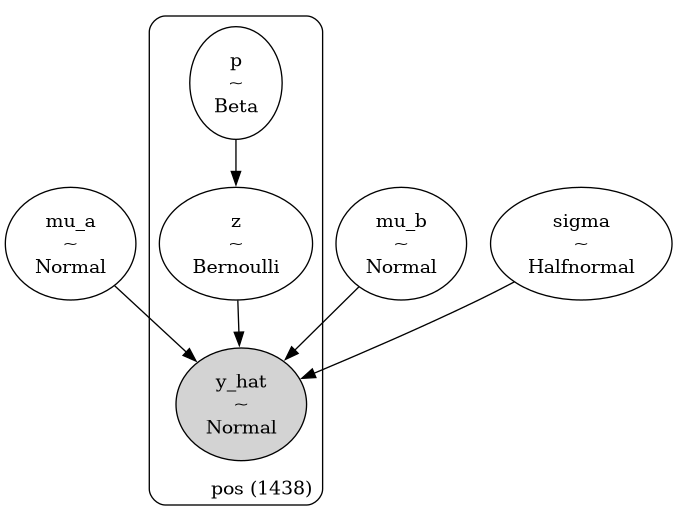

### Model 2: Spatially dependent (Random Walk)

To account for autocorrelation along the positional axis, I implement a Gaussian Random Walk (GRW) in the logit space of the compartment assignment. That is, the steps between each assignment probability are restricted with a random walk from bin `i` to the next bin `i+1`. Instead of drawing the compartment probability, $p$, from a flat prior directly, some new variables are introduced. A GRW is effectively the cumulative sum of steps along the positional axis, and can be defined as centered or non-centered \[ref\]. The centered version is pre-implemented in PyMC as `pymc.GaussianRandomWalk` \[ref\], taking a `sigma` parameter for standard deviation. In the centered GRW, the step size and standard deviations are exploring parameter space together and might ot explore it as efficiently or as quickly as a non-centered model that samples the two parameters independently. On the other hand, the non-centered model might interact more with hyperparameters and data. Better results achieved from a non-centered model might indicate that the data is not informative enough for the tighter restrictions on the posterior imposed by the centered model.

#### Centered GRW

The new variable `grw_sigma` was sampled from a Half-Normal distribution and given to the `logit_p` that models the GRW with `pymc.GaussianRandomWalk`. As noted, both variables explore parameter space together. Then, the logits are converted to probabilities, $p$, by squashing them through a sigmoid, and finally, the compartment is assigned as in the *i.i.d.* model by a Bernoulli trial.

$$
\begin{aligned}
\mu_A &\sim \mathcal{N}(0.5, 0.5) \\
\mu_B &\sim \mathcal{N}(-0.5, 0.5) \\
\sigma &\sim \mathcal{HN}(1) \\
\sigma_{\mathrm{GRW}} &\sim \mathcal{HN}(0.01)\\
\mathrm{logit}_p &\sim \operatorname{GaussianRandomWalk}(\sigma_{\mathrm{GRW}}) \\
p &= \operatorname{sigmoid}(logit_w) \\
z_i &\sim \text{Bernoulli}(p) \\
\mu_i &= 
\begin{cases}
\mu_A & \text{if } z_i = 1 \\
\mu_B & \text{if } z_i = 0
\end{cases} \\
y_i &\sim \mathcal{N}(\mu_i, \sigma) \\
\end{aligned}
$${#eq-centered-grw}

#### Non-centered GRW

There are different opinions on when to reparameterize a centered model into a non-centered model \[ref\], but in my case, PyMC suggested a reparameterization. The idea is to fit the parameters independently and thus achieve a less restricted exploration of parameter space. In this case, the random walk is modeled as follows: the step size is a separate variable, `eps`, drawing from a standard Gaussian distribution. Then, the step size is scaled by `grw_scale`, which is drawn from a HalfNormal when adding each step to the random walk by cumulative summation. Again, the walk is constructed in logit space, $\mathrm{logit}_w$, and forced through a sigmoid to obtain assignment probabilities, and finally, the assignment is performed with a Bernoulli trial on $w$:

$$
\begin{aligned}
\mu_A &\sim \mathcal{N}(0.5, 0.5) \\
\mu_B &\sim \mathcal{N}(-0.5, 0.5) \\
\sigma &\sim \mathcal{HN}(1) \\
\sigma_{\mathrm{GRW}} &\sim \mathcal{HN}(0.01)\\
\epsilon_{\mathrm{GRW}} &\sim \mathcal{N}(0, 1) \\
\mathrm{logit}_{w_i} &= \sum_{k=1}^i \epsilon_{\mathrm{GRW}, k} \, \sigma_{\mathrm{GRW}} \\ 
z_i &\sim \text{Bernoulli}(p) \\
\mu_i &= 
\begin{cases}
\mu_A & \text{if } z_i = 1 \\
\mu_B & \text{if } z_i = 0
\end{cases} \\
y_i &\sim \mathcal{N}(\mu_i, \sigma) \\
\end{aligned}
$${#eq-non-centered-grw}

## Evaluations

To be able to comparatively evaluate the models, we must establish exactly what we are modeling. The biological assumptions we make are that **1)** a given genomic region can be one type at a time, and **2)** the autocorrelation between intervals along the genome can be modeled by probabilistic smoothing of the E1 track, even at 10kb resolution. The goal is not to discover new compartments, but to model the transitions between compartments with the assumption that some peaks or dips in E1 that barely cause a sign change are potentially caused by noise and are thus not of biological relevance. Of course, the ability to model this behaviour relies heavily on the assumption that the value of the E1 track carries information about the distinction between compartments, in addition to that of the sign of the vector.

In a classical setting, the way to compare Bayesian models is by *some* measure of how much *information* a model has learned from the data it was trained on. *Arviz* provides the *Akaike Information Criterion* (AIC) and the *Widely Applicable Information Criterion* (WAIC), where it uses leave-one-out cross-validation (LOO-CV) to generate the out-of-sample predictive accuracy. Conveniently, the `arviz.compare` takes multiple models and generates a neat table with the results of its cross-validation analysis.

However, when an expected result of the model is that some peaks or small compartments are reduced or smoothed, we must question the interpretability of these criteria. At least, the balance between generalization and fitting should be skewed towards generalization, expectedly at the cost of fitting. Additionally, there is some dispute around using CV for time series (or random walk models), as the left-out samples will affect the autocorrelated nature of the predictions [ref](https://statmodeling.stat.columbia.edu/2015/01/16/loo-waic-time-series/). However, it seems that when using CV for model comparison, the same bias is introduced in all the compared models, and can thus largely be ignored.

## Parameter sweep

The flexibility of a model can be increased by selecting a heavier-tailed distribution for the prior, allowing a broader exploration of the parameter space, and making extreme values more probable. This was done for the priors on $\mu_{A}$ and $\mu_{B}$, and for the scale parameter of the GRW, $\sigma_{\mathrm{GRW}}$. Here, special care has to be taken to strike a balance between a model that is too flexible and cannot generalize, and one that is too rigid and cannot learn from the data. For a heavier-tailed distribution, the T-distribution was chosen with a varying number of degrees of freedom, `nu`. For large {$\nu$}s $\nu \geq 20$, the distribution closely approximates the normal distribution. Here, $\sim\!30$ combinations of compartment and step scale distributions ($\mu_A,\mu_B, \sigma_{\mathrm{GRW}} \in [T_{\mathrm{dist}}, N_{\mathrm{dist}}]$) with different $\nu$ for the T distributions. The parameter sweep was performed using the continuous mixture model for efficiency purposes. So long as the bins are dependent, the less accurate model was deemed sufficient. Then, the posterior traces were compared with `arviz.compare()`, comparing the information retained in each model using leave-one-out cross-validation (LOO CV) to achieve the generic log-predictive density (ELPD). The best non-diverging models were chosen for further refinement by adding the latent type assignment, `z`, and refitting the model.

## Resolutions and subsets

After initial evaluations of the foundational architecture were done by fitting 100kb resolution data, the same architecture was applied to higher resolution (10kb) data. That is, we assume the system of variables has the same relationship and can be drawn from the same distributions as the lower-resolution data. To achieve a comparable runtime, a subset of the data was selected from a 1500-bin interval that was qualitatively determined to have high variance. However, not only was the resolution changed, but also the data set. For the hi-res analysis, I used the GRCh38-mapped data set from human X-bearing sperm, and did no further investigation of the macaque data, although it could be an interesting insight to quantify the differences of the compartment calls from the previous study.

Initially, the selected subset was thought to have a good amount of variance, but upon further investigation, it could also be interpreted as a high level of noise compared to biological information. Therefore, the same model architecture was applied to the two chromatin arms separately, and lastly, to the full X chromosome.

The best performing model on the 100kb data was refitted with the 10kb human data set. However, to get similar bin sizes, a subset of 1500 bins was taken from the E1 track. Additionally, the small chromatin arm was used as a subset, and lastly, the full chromosome X was fitted to the same model architecture.

# Results

## The ICE

After remapping the macaque data to the T2T assembly, the eigentracks were calculated as described. The E1 tracks were visually evaluated at the different resolutions (@fig-e1-sperm), showing the expected shifts in E1 values on the megabase scale for all resolutions except 1kb. This means that the sequencing was not sufficiently deep for binning Hi-C contacts into 1000 bp regions, and many bins have zero or only a few contacts. To be sure to have informative enough data, the 10kb resolution was chosen for further analysis in probabilistic modeling. Factoring in the experience of @lajoie2015hitchhikersguidehic that $100,000,000$ valid reads is sufficient for 40kb resolution without too much noise, this is still a rather optimistic choice, as we have only $\sim 12,500,000$ valid interactions from the sperm cells. However, this underlines the need for modeling the noise when fitting the models later.

``` python
alpha_list = [0.2, 0.2, 0.3, 0.7, 0.9] # Adjusted alpha for scatter points

for alpha,res in zip(alpha_list,['1000', '5000', '10000', '50000', '100000']):
    plot_eigenvectors(sperm_dict[res], title=None,
                      scatter=True, 
                      scatter_alpha=alpha)
```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>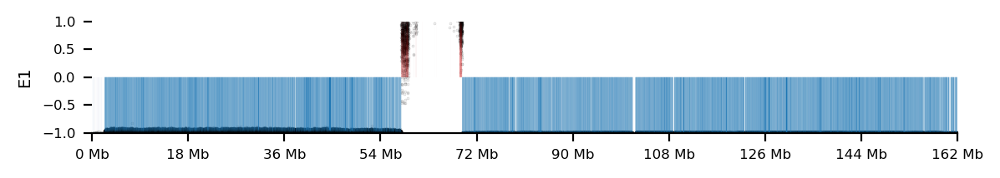</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>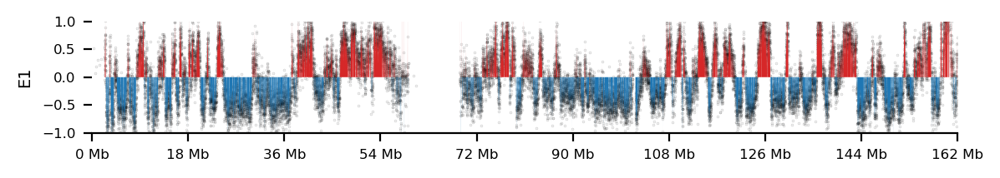</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>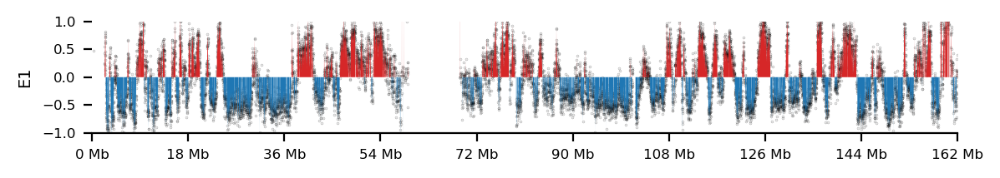</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>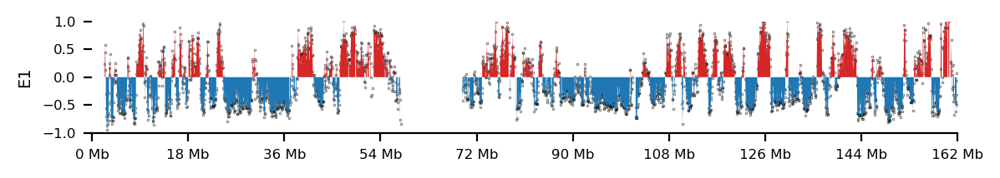</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>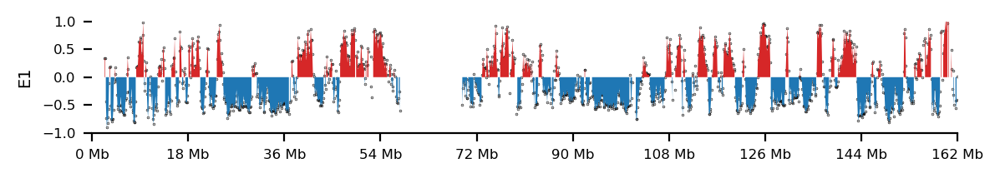</p>
</div></td>
</tr>
</tbody>
</table>

E1 eigenvector for T2T-MMU8v1 sperm at different resolutions. The E1 eigenvector is the first eigenvector of the covariance matrix of the Hi-C contact matrix, and it captures the dominant mode of variation in the data. The classical definitions, A: E1 \> 0 and B: E1 \< 0, are shown in red and blue, respectively. E1 values are overlayed as scatter.

We were less confident in the human sperm data, as approximately half of the cells were filtered out compared to the original study (they had the Y chromosome), resulting in only $\sim 3,500,000$ valid interactions. This is evidently not sufficient for high-resolution analysis directly, visualized by the extreme noise level in @fig-e1-sperm-x-2 and @fig-e1-sperm-x-3.

``` python
alpha_list = [0.2, 0.2, 0.3, 0.7, 0.9] # Adjusted alpha for scatter points

for alpha,res in zip(alpha_list,['1000', '5000', '10000', '50000', '100000']):
    plot_eigenvectors(sperm_X_dict[res], 
                      title=None,
                      scatter=True,
                      scatter_alpha=alpha)
```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>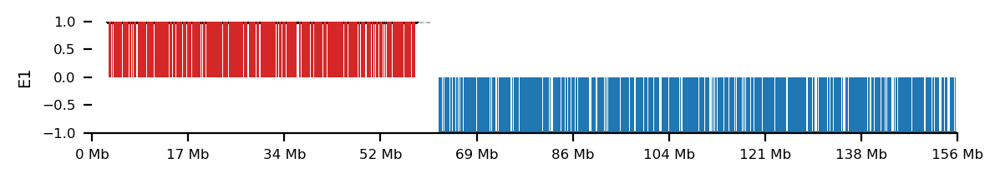</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>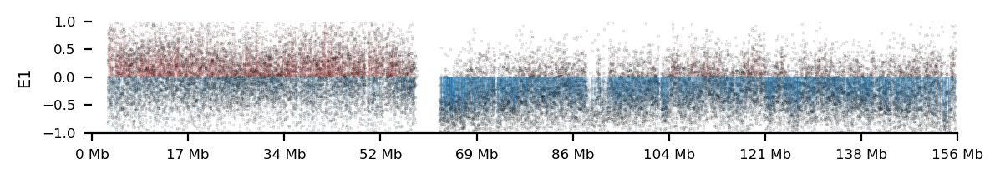</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>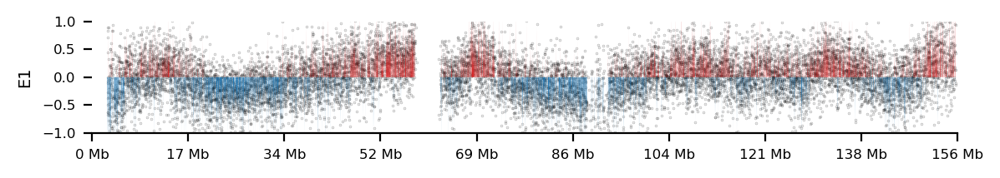</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>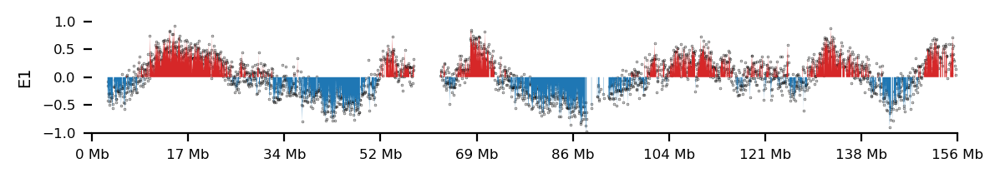</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>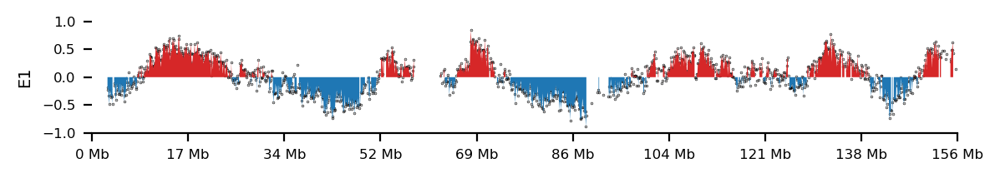</p>
</div></td>
</tr>
</tbody>
</table>

E1 eigenvector for human GRCh37 sperm at different resolutions. The E1 eigenvector is the first eigenvector of the covariance matrix of the Hi-C contact matrix, and it captures the dominant mode of variation in the data. The classical definitions, A: E1 \> 0 and B: E1 \< 0, are shown in red and blue, respectively. E1 values are overlayed as scatter.

However, we remain optimistic about a probabilistic approach, as we observe a general trend even in the 10kb resolution, although with much more noise than in the macaque data. The noise level of the human X-bearing sperm data at 50kb resembles that of 5kb in the macaque sperm data (comparing @fig-e1-sperm and @fig-e1-sperm-x).

### Autosomal comparison

The eigendecomposition of chromosome 8 for X- or Y-bearing sperm resulted in a highly noisy E1 track, comparable to that of the X chromosome, and there is overall consistency between resolutions (@fig-chr8-eigs A, C, E and B, D, F). Comparing chr8-X with chr8-Y reveals some distinction between boundaries, especially on the long chromatin arm. For chr8-X, there are generally more compartments predicted by eigendecomposition than for chr8-Y, which could indicate a connection between the harbored sex chromosome and higher-order structural architecture such as A/B-compartments.

``` python
for res, dict in eig_dict.items():
    df_e1_x = dict['X']
    df_e1_y = dict['Y']
    
    plot_eigenvectors(df_e1_x, title=None)

    
    plot_eigenvectors(df_e1_y, title=None)
```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>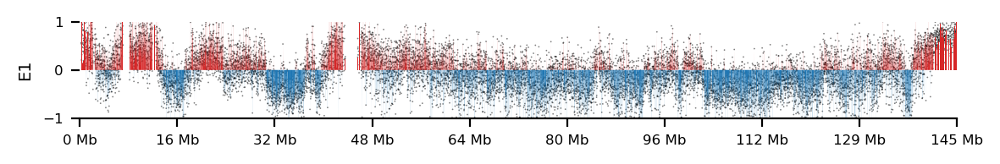</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>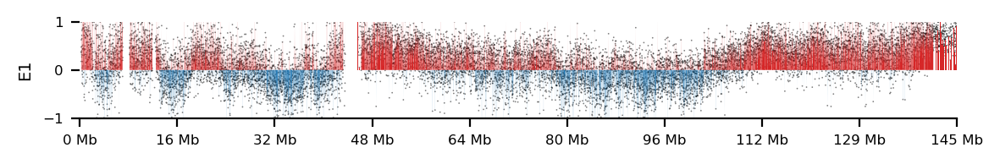</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>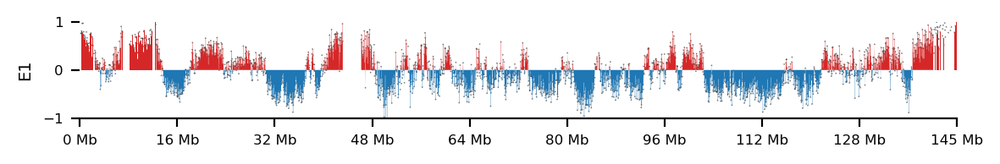</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>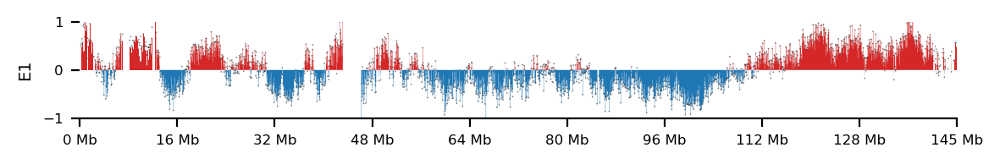</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>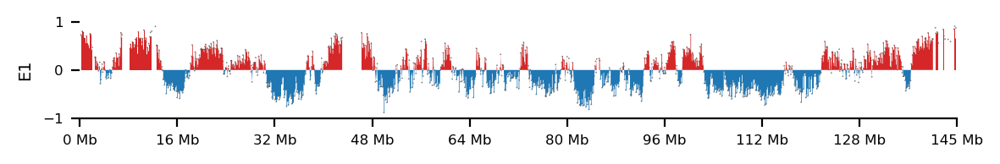</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>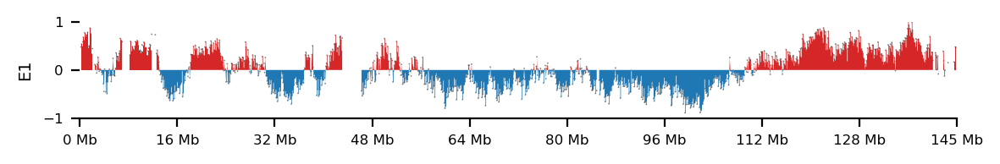</p>
</div></td>
</tr>
</tbody>
</table>

Comparing the eigenvector E1 for chr8 in X- and Y-bearing sperm at different resolutions. Here, the eigenvectors are re-sorted by their Spearman correlation with the GC content.

## The models

### Independent bins

The i.i.d. model showed good mixing and separation of the two type distributions in the trace plots (@fig-iid-trace-mu-sigma), and the distribution from the posterior predictive checks resembles the observed distribution, `y_lik` being our $E1$ estimate (@fig-iid-trace-mu-sigma, bottom row). However, plotting the posterior mean of the E1 estimate revealed that the model had learned it was safest to predict a value close to zero but with a wide HDI (@fig-iid-trace-ylik). This means that the i.i.d. model has no predictive power. Interestingly, the results from LOO-CV indicated that the model was well inside the Cumulative Distribution Function (CDF), seen from the Empirical CDF (ECDF) in `arviz.plot_loo_pit` (@fig-iid-ppc-loo-pit). This raises the question of the validity of using cross-validation to evaluate our models; though the posterior predictive distribution resembles the observed variable, the credible intervals are enormous.

``` python
f,axs = plt.subplots(3,2, figsize=(6,4)) 

az.plot_trace(trace, var_names=["mu", 'sigma'], compact=True, axes=axs, 
              trace_kwargs={'linewidth':0.3, 'alpha':0.5},
              plot_kwargs={'alpha':0.5, 'linewidth':0.5})

az.plot_ppc(trace, num_pp_samples=500, group="prior", ax=axs[2,0])
#plt.legend(loc="upper right")
axs[2,0].set_ylim(0,8);
az.plot_ppc(trace, num_pp_samples=500, group="posterior", ax=axs[2,1])
#plt.legend(loc="upper right")

for ax in axs.ravel():
    ax.title.set_fontsize(8)
    ax.xaxis.label.set_size(7)
    ax.yaxis.label.set_size(7)
    ax.tick_params(labelsize=6)

plt.show()
```

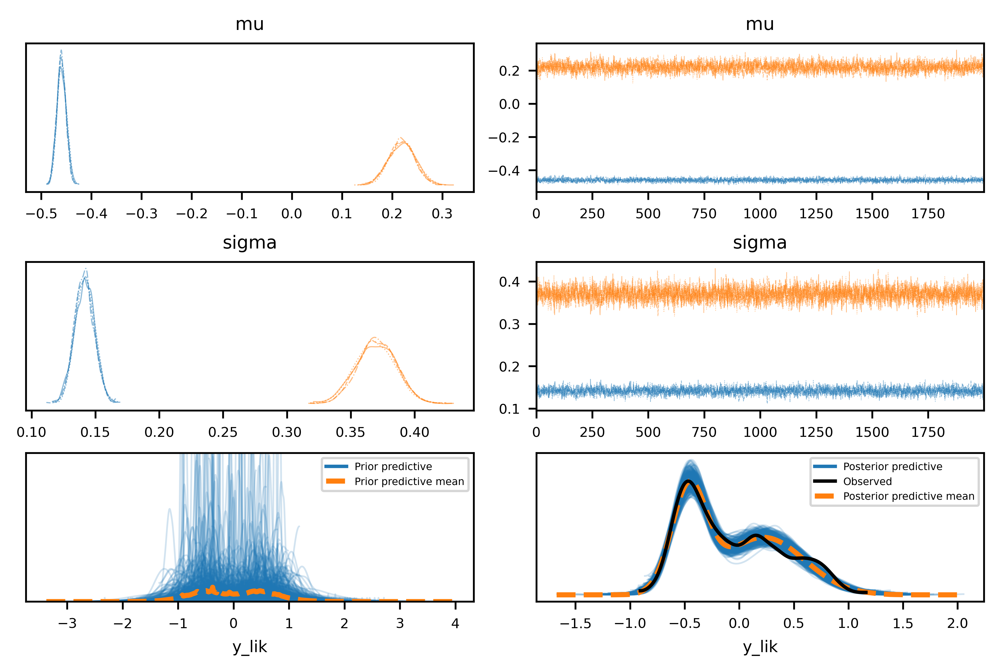

``` python
f,ax = plt.subplots(figsize=(6,1.3))
ax.plot(df['start'], trace_ylik['mean'], lw=0.3, label="$\\hat{y}_{\\mathrm{post}}$")
ax.fill_between(df['start'], trace_ylik['hdi_97%'], trace_ylik['hdi_3%'], color="tab:grey", alpha=0.3, label="95% HDI")
plt.legend()
# plt.tight_layout()
plt.show()
```

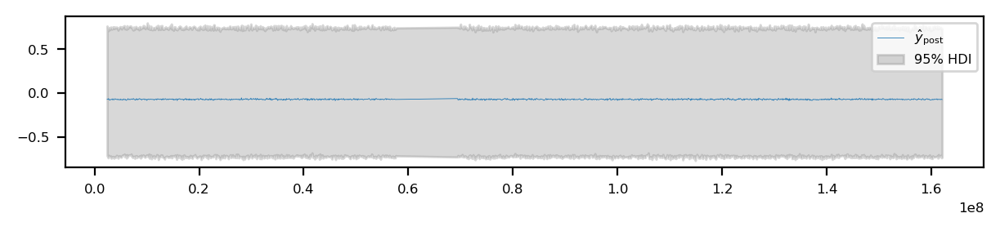

``` python
az.plot_loo_pit(trace, y_hat="y_lik", y = "y_lik", ecdf=True, figsize=(6,1.3))
# plt.tight_layout()
```

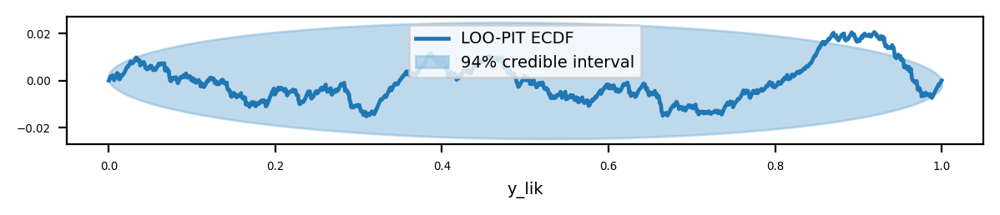

### Random Walk (spatial dependency)

The initial random walk model fitted to macaque data showed good separation of underlying means and good mixing. However, the LOO-CV did indicate an overdispersed model (@fig-grw-ppc-50kb-loo-pit), as the ECDF lay grossly outside of the uniform CDF. However, as mentioned previously, the LOO-CV might not even be a good indicator of fit, but instead we may rely on a visual inspection of how well it seems to catch a trend in the observed E1 in a posterior predictive check. From this initial model, a parameter sweep was performed, varying the underlying distributions and parameters as described. Only the highest-scoring (non-diverging) models were used in the following, as this was used for an indication of a model architecture that has biological relevance and could be generalized into other data as well. Thus, I continued on the human sperm cells.

``` python
az.plot_loo_pit(idata, y = "y_hat", ecdf=True, figsize=(6,1.3))
# plt.tight_layout()
```

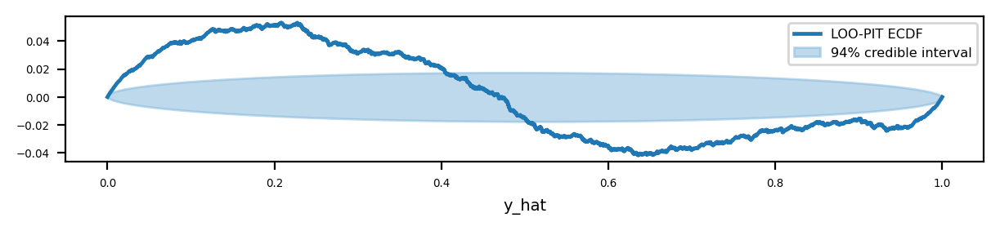

## Human data

### Small chromosome arm

For the subset analysis, only a fully Gaussian model was fitted to the short chromatin arm of chrX in human sperm in 10kb resolution. I used both the discrete and the continuous model architectures, `z` and `w`, respectively. The models both mixed well and each showed two distinct means for underlying ‘type’ distributions, supporting the idea of a generalizable underlying model architecture. This was additionally supported by the posterior predictive plot, $\widehat{E1}$, that seems to follow the trend of the observed $E1$ (@fig-hum-x-subset-ppc-trace-w-z-compare). However, the discrete model is seemingly more affected by the noisy fluctuations than the continuous model (@fig-hum-x-subset-ppc-trace-w-z-compare-1), even though it does not show in the built-in `pymc.plot_ppc(trace)` (@fig-hum-x-subset-ppc-dist-w-z-compare).

``` python
import matplotlib.pyplot as plt
 
traces = {
    'trace_z': trace_z,
    'trace_w': trace_w
}

for name, trace in traces.items():
    yhat_mean = trace.posterior_predictive.y_hat.mean(dim=('chain', 'draw'))
    yhat_upper = trace.posterior_predictive.y_hat.quantile(0.975, dim=('chain', 'draw'))
    yhat_lower = trace.posterior_predictive.y_hat.quantile(0.025, dim=('chain', 'draw'))

    f,ax = plt.subplots(figsize=(6, 1.2))

    ax.plot(yhat_mean['pos'],yhat_mean, label=r"$\hat{y}_{\mathrm{post}}$", linewidth=0.5)
    ax.hlines(0, min(yhat_mean['pos']), max(yhat_mean['pos']), color='red', linestyle='--', linewidth=0.7)

    ax.fill_between(yhat_mean['pos'], 
                    yhat_upper,
                    yhat_lower,
                    alpha=0.3, label="95% CI", color='blue', ec='None')

    ax.plot(trace.observed_data.y_hat['pos'], trace.observed_data.y_hat, alpha=0.5, color='gray', linewidth=0.3, label="Observed y")
    ax.set_ylim(-1.1, 1.1)

    # plt.title("Posterior Predictive Check for X-bearing sperm ($\\widehat{E1}$) " + f"`{name}`") # remove when using YAML fig-cap
    # Move the legend outside of the plot (right hand side)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    # # plt#tight_layout()

```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>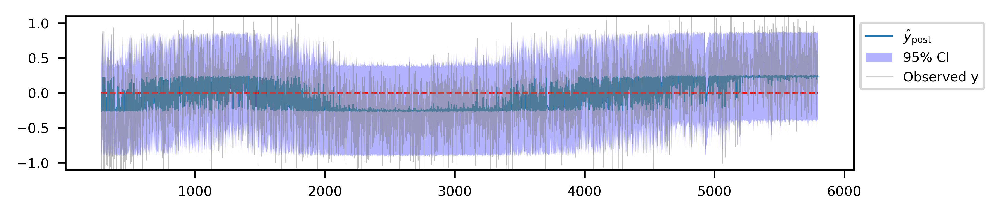</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>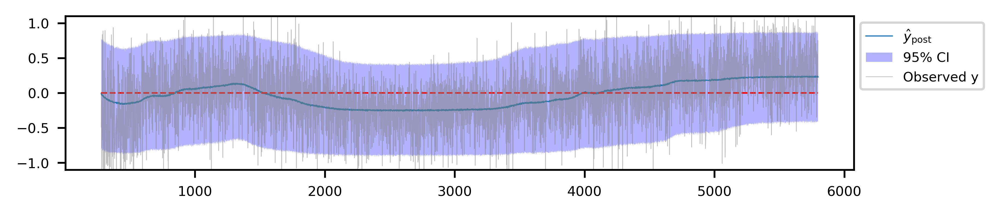</p>
</div></td>
</tr>
</tbody>
</table>

ChrX Posterior Predictive Check for X-bearing sperm ($\widehat{E1}$) for both the Z and W models. The posterior mean is shown as a blue line, with the 95% credible interval shaded in blue. The observed E1 values are shown in gray.

``` python
az.plot_ppc(trace_z, figsize=(3, 1.5))
plt.show()
az.plot_ppc(trace_w, figsize=(3, 1.5))
plt.show()
```

<table>
<colgroup>
<col style="width: 50%" />
<col style="width: 50%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="50.0%" data-layout-align="left">
<p>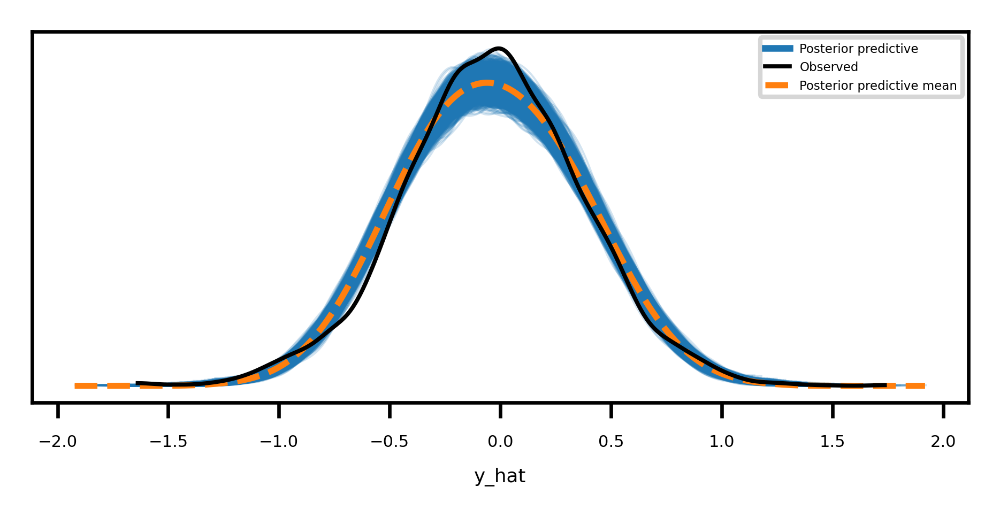</p>
</div></td>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="50.0%" data-layout-align="left">
<p>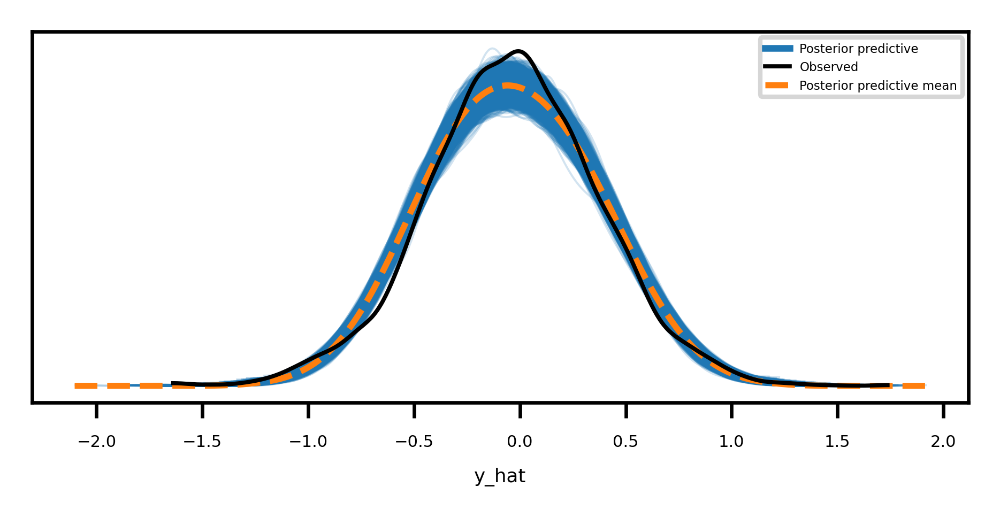</p>
</div></td>
</tr>
</tbody>
</table>

ChrX Posterior Predictive Check Distribution for X-bearing sperm ($\widehat{E1}$) for both the Z and W models. The posterior predictive distribution is shown in blue, the predictive mean in dashed orange, and the observed E1 distribution in black.

From the model, we can quantify the uncertainty in compartment assignment from the mixing weight (designated `w`; values between $0$ and $1$), and the trace contains the full posterior sampling. To create a credible interval (CI) around the posterior mean of `w`, I use the $97.5th$ and $2.5th$ percentiles of each bin and plot a confidence band. Then transition zones were identified by a CI rule: $\mathrm{bin}_i$ *is in a transition zone if*

$$
\begin{aligned}
1/3 &< \textrm{CI}^{2.5\%}_i &< 2/3 &\quad \mathbf{or} \\
1/3 &< \textrm{CI}^{97.5\%}_i &< 2/3 &\quad \mathbf{or} \\
1/3 &> \textrm{CI}^{2.5\%}_i &\mathbf{and} \; &2/3 < \textrm{CI}^{97.5\%}_i,
\end{aligned}
$$ {#eq-ci-rule}

That is, if either of $\textrm{CI}^{2.5\%}_i$ and $\textrm{CI}^{97.5\%}_i$ are between $1/3$ and $2/3$, or if they are on each side of the CI (very wide band), the bin is in a transition zone. This results in three transition zones for chrX short arm in human sperm cells, excluding the first (@fig-hum-x-subset-posterior-cross-dens-ci-w). Note that here, I used a simplified CI rule,

$$
1/3 < \hat{w}_{post,i} < 2/3
$$ {#eq-ci-rule-simple}

Additionally, the transition zones are extracted, and the number of posterior draws that cross $0.5$ in each bin is counted as well. On @fig-hum-x-subset-posterior-cross-dens-ci-w-1, the counts are divided by the total number of draws, giving the proportion of curves that cross the threshold at for a given bin. Additionally, the crosses were grouped into upwards and downwards crosses, distinguishing $A\rightarrow B$- from $B\rightarrow A$ crosses. However, the bin size equals the resolution of the data (10kb windows), meaning there are ~6,000 bins for the chrX short arm. This makes the barplot unreadable when on the same y-axis as $w$, but I decided not to add an arbitrary normalization to increase the visibility, as it would not increase interpretability. Accumulating the crosses in each interval shows that many of the curves cross the threshold more than once (i.e., there are more crosses than there are curves), as is expected when the mean is near the given threshold ($w = 0.5$ in this case). Despite the low proportion crossing at each bin (0%-3% range), @fig-hum-x-subset-posterior-cross-dens-ci-w-2 visually confirms the expectation that within a transition zone, the majority of crosses are upwards when the mean also crosses upwards ($B\rightarrow A$) and vice versa.

``` python
import matplotlib.pyplot as plt

import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('png', dpi=600)

x = w_stack_z["pos"]
figsize = (6,1.3)
f, ax = plt.subplots(figsize=figsize)

ax.fill_between(
    x,
    w_ci_lower_direct,
    w_ci_upper_direct,
    alpha=0.3,
    label="95% CI",
    color="blue",
    ec='None'
)

x_grey = x.copy()
x_grey = x_grey.where(
    ~((w_mean < 1/3) | (w_mean > 2/3)), np.nan
    #~((w_ci_lower_direct < 1/3) & (w_ci_upper_direct < 1/3) | (w_ci_lower_direct > 2/3) & (w_ci_upper_direct > 2/3)), np.nan
)

# Grey band
ax.fill_between(
    x, 
    0,
    1,
    where=x_grey.notnull(),
    alpha=0.1,
    color='gray')

# Add the CI rule as text
ax.text(0.02, 0.95, "CI Rule: $1/3 < \\hat{w}_{post} < 2/3$", 
        transform=ax.transAxes, fontsize=6, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5, pad=1))

# Plot the posterior mean
ax.plot(x, w_mean, label="Posterior mean", color="black", linewidth=0.3)

# Plot the 0.5 line
ax.hlines(0.5, min(x), max(x), color="black", linestyle='dotted', linewidth=0.5)

# # Plot the CI rules
ax.hlines([0.33,0.66], min(x), max(x), color="red", linestyle=(0, (5, 10)), linewidth=0.5)

# Plot the crossing counts
ax.bar(x[:-1], crossing_density_up, label="A->B", color="tab:red", linewidth=0.3, alpha=0.7)
ax.bar(x[:-1], crossing_density_down, label="B->A", color="tab:blue", linewidth=0.3, alpha=0.5)

#  make x-axis tick x 10000 
ticks = np.arange(0, len(x), step=10*1e06/10000)
ax.set_xticks(ticks)
ticklabels = ax.set_xticklabels([f"{int(tick/100)}Mb" for tick in ticks])

plt.ylabel("w ; Crossing Density")
#plt.xlabel("Position (10kb bins)")
plt.legend(loc='lower right')
#plt.title("Posterior Probability with Raw Mixing Weight CI and Crossing Density")
# # plt#tight_layout()
plt.show()

## Now a new plot for only the crossing density

f, ax = plt.subplots(figsize=figsize)

ax.bar(x[:-1], crossing_density_up, label="A->B", color="tab:red", ec='None', linewidth=0, alpha=0.7)
ax.bar(x[:-1], crossing_density_down, label="B->A", color="tab:blue", ec='None', linewidth=0, alpha=0.5)

ax.set_ylim(0, np.quantile(crossing_density, 0.95))
# reuse ticks from previous plot
ax.set_xticks(ticks)
ax.set_xticklabels(ticklabels)
plt.ylabel("Crossing Proportion")
plt.show()
```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>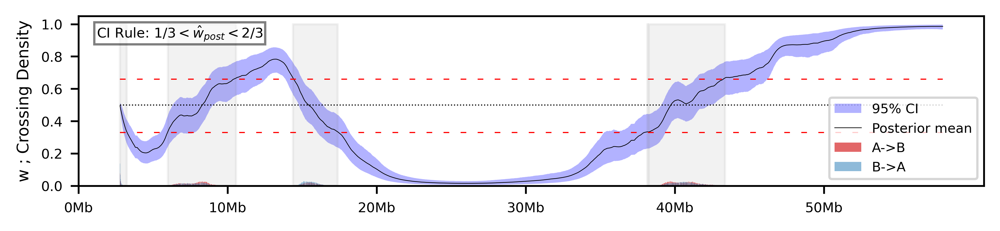</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>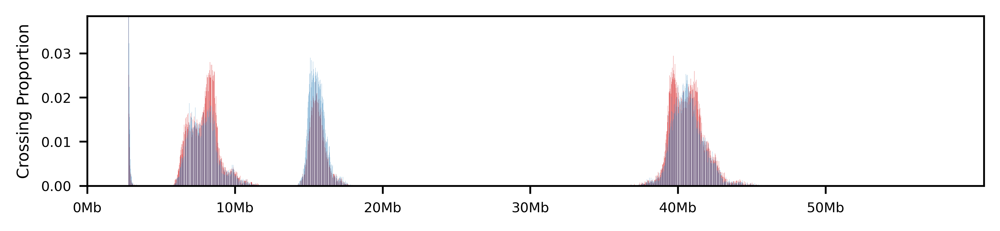</p>
</div></td>
</tr>
</tbody>
</table>

Posterior Probability with Raw Mixing Weight CI and Crossing Density. The CI rule used is $1/3 < \hat{w}_{post} < 2/3$, as shown. The grey band indicates the regions where the CI rule is not satisfied. The crossing density bars show the proportion of posterior draws that cross at 0.5, with red indicating crossings upwards and blue indicating crossings downwards.

### Full chromosome X

As the subset analysis looked promising, the same architecture was used to model the full chromosome X. That is, I still assume that E1 values can be drawn from Gaussian distributions with a negative mean for B compartments and a positive mean for A compartments. Then, I assume the compartment type (A or B) for each bin is a latent state that can be inferred from the value of the E1. I assume spatial dependency and use a GRW to walk along the E1 track.

Again, both the discrete and mixture model were fitted, and even though both models seem to mix well (@fig-hum-x-full-ppc-trace-w-z-compare), the NUTS-sampler threw warnings for the discrete model and the posterior predictive $\hat{y}_{post}$ for the discrete model is, as with the subset, less smooth than the continuous model, even though the 95% CI bands are indistinguishable. However, both models seem to catch the variance of the observed E1 track in their posterior predictive (@fig-hum-x-full-ppc-dist-w-z-compare).

``` python
import matplotlib.pyplot as plt
 
traces = {
    'trace_z': trace_z,
    'trace_w': trace_w
}

for name, trace in traces.items():
    yhat_mean = trace.posterior_predictive.y_hat.mean(dim=('chain', 'draw'))
    yhat_upper = trace.posterior_predictive.y_hat.quantile(0.975, dim=('chain', 'draw'))
    yhat_lower = trace.posterior_predictive.y_hat.quantile(0.025, dim=('chain', 'draw'))

    f,ax = plt.subplots(figsize=(6, 1.2))

    ax.plot(yhat_mean['pos'],yhat_mean, label=r"$\hat{y}_{\mathrm{post}}$", linewidth=0.5)
    ax.hlines(0, min(yhat_mean['pos']), max(yhat_mean['pos']), color='red', linestyle='--', linewidth=0.7)

    ax.fill_between(yhat_mean['pos'], 
                    yhat_upper,
                    yhat_lower,
                    alpha=0.3, label="95% CI", color='blue', ec='None')

    ax.plot(trace.observed_data.y_hat['pos'], trace.observed_data.y_hat, alpha=0.5, color='gray', linewidth=0.3, label="Observed y")
    ax.set_ylim(-1.1, 1.1)

    # plt.title("Posterior Predictive Check for X-bearing sperm ($\\widehat{E1}$) " + f"`{name}`") # remove when using YAML fig-cap
    # Move the legend outside of the plot (right hand side)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    # # plt#tight_layout()

```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>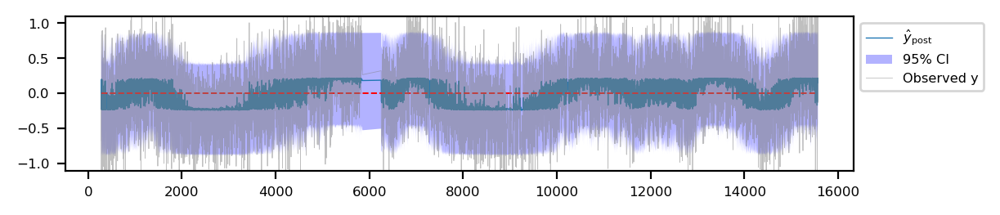</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>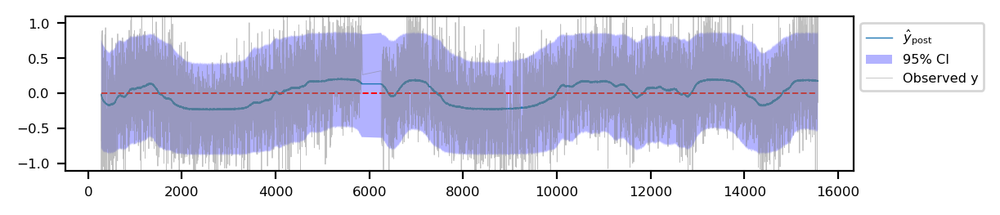</p>
</div></td>
</tr>
</tbody>
</table>

ChrX Posterior Predictive Check for X-bearing sperm ($\widehat{E1}$) for both the Z and W models. The posterior mean is shown as a blue line, with the 95% credible interval shaded in blue. The observed E1 values are shown in gray.

``` python
az.plot_ppc(trace_z, figsize=(3, 1.5));
az.plot_ppc(trace_w, figsize=(3, 1.5));
```

<table>
<colgroup>
<col style="width: 50%" />
<col style="width: 50%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="50.0%" data-layout-align="left">
<p>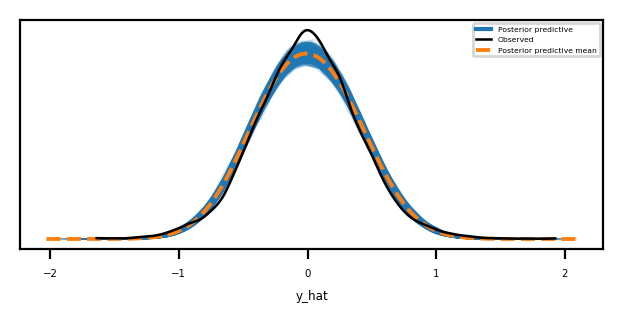</p>
</div></td>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="50.0%" data-layout-align="left">
<p>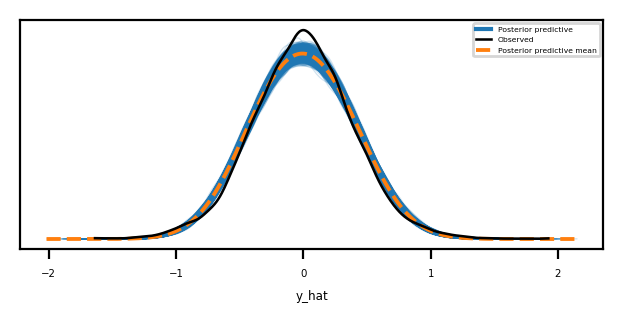</p>
</div></td>
</tr>
</tbody>
</table>

ChrX Posterior Predictive Check Distribution for X-bearing sperm ($\widehat{E1}$) for both the Z and W models. The posterior predictive distribution is shown in blue, the predictive mean in dashed orange, and the observed E1 distribution in black.

It *looks like* I have found a model architecture that can infer a probability of being in a given compartment, and that the model parameters are somewhat generalizable to multiple data sets and resolutions.

### Chromosome 8 on X- or Y-bearing sperm

I fit the model to chr8 of X- or Y-bearing human sperm, to see if the crossing distributions change between the presence of either X or Y. By visual inspection, the results of ICE indicate some differences between assignment, especially on the long arm, where the Y-bearing sperm only show a few transitions. This could mean that either the PC1 does not capture the variance attributed to 3D organization, but some other feature that correlates in the obs/exp matrix, or it could mean that the compartmental structure of chromosome 8 is different between X- and Y-bearing sperm. The short arm looks nearly identical between the two data sets.

Only the model on X-bearing sperm (X-model) mixed well, as the previous models have done. In the model for Y-bearing sperm (Y-model), the chains do not mix fully, a new mode appears in the trace plot (@fig-chr8-compare-traces-energy-nnhn, dashed curve) at $\mu=0.2$, approximately in the midpoint between the two expected means. This is accompanied by an extra mode in `grw_sigma` as well, and both modes of `grw_sigma` are below that of the X-model. As `grw_sigma` is the scaling of the step size, this means that the sampler has difficulty taking larger steps, which is possibly the reason for the ‘middle’ mode of `mu` —allowing for smaller steps that still satisfy the ordering of `mu` ($\mu_B < \mu_A$).

``` python
import matplotlib.pyplot as plt
tmp_traces = [traces[f'{resname}.X.NNHN'], traces[f'{resname}.Y.NNHN']]

for tmp_trace in tmp_traces:
    f,axs = plt.subplots(4,2, figsize=(6,4)) 


    az.plot_trace(tmp_trace, var_names=["mu", 'sigma', 'grw_sigma'], compact=True, axes=axs, 
                trace_kwargs={'linewidth':0.3, 'alpha':0.5},
                plot_kwargs={'alpha':0.5, 'linewidth':0.5})

    az.plot_ppc(tmp_trace, num_pp_samples=500, group="prior", ax=axs[3,0])
    axs[3,0].set_ylim(0,6)
    az.plot_ppc(tmp_trace, num_pp_samples=500, group="posterior", ax=axs[3,1])

    for ax in axs.ravel():
        ax.title.set_fontsize(8)
        ax.xaxis.label.set_size(7)
        ax.yaxis.label.set_size(7)
        ax.tick_params(labelsize=6)
    plt.show()
```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>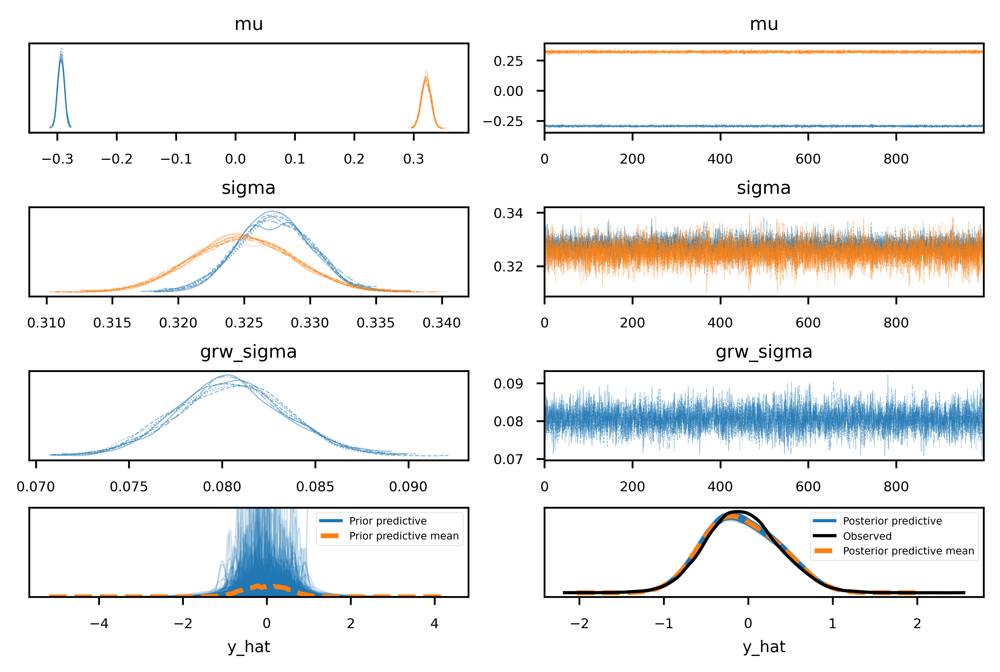</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>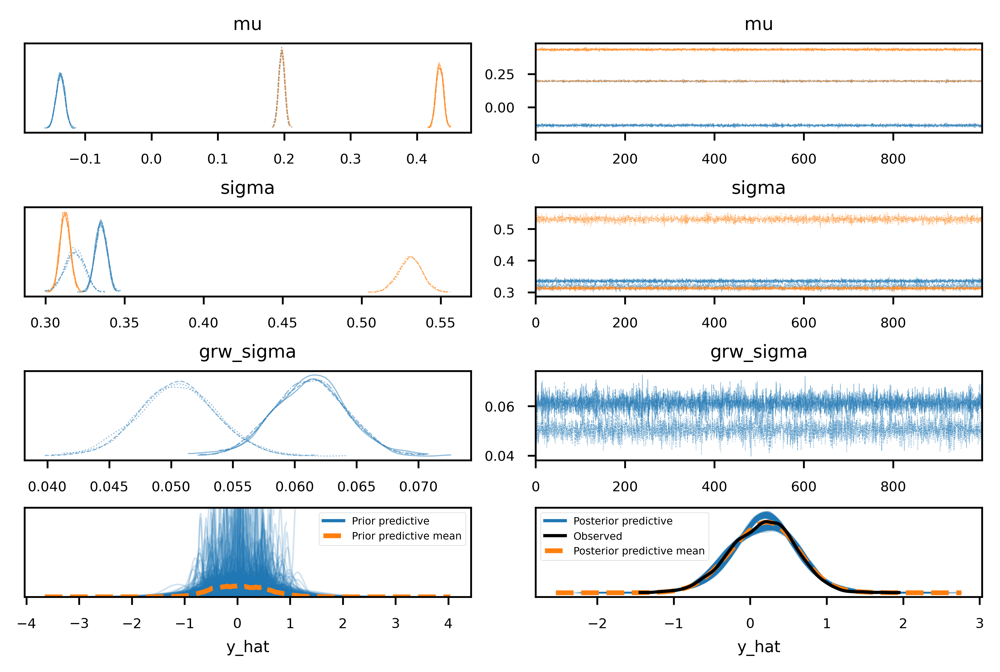</p>
</div></td>
</tr>
</tbody>
</table>

Trace and energy plots for the two NNHN models fitted to chr8 in X- and Y-bearing sperm at 10kb resolution.

For further investigation, `arviz.plot_rank()` was used to evaluate the chains. This plots a histogram of the rank of each draw per chain. If the chains are mixing well, i.e., they are sampling from the same distribution, the ranks should be uniformly distributed. For `grw_sigma` in the Y-bearing sperm data (@fig-chr8-compare-rank-nnhn), the ranks are not uniform, indicating that some chains are exploring only part of the posterior or are trapped in local modes, which limits full exploration of the parameter space. This is expected for `grw_sigma` because it governs the scale of the GRW innovations, which are highly coupled to the latent weights; noisy E1 tracks can create multiple plausible step sizes, leading to multimodal posteriors and non-uniform ranks. With that critique in place, the posterior predictive (from `arviz.plot_ppc()`, @fig-chr8-compare-traces-energy-nnhn bottom) follows the observed data very closely.

``` python
f,ax = plt.subplots(figsize=(3,2))
az.plot_rank(tmp_traces[0], var_names=['grw_sigma'], ax=ax)
plt.show()

f,ax = plt.subplots(figsize=(3,2))
az.plot_rank(tmp_traces[1], var_names=['grw_sigma'], ax=ax)
plt.show()
```

<table>
<colgroup>
<col style="width: 50%" />
<col style="width: 50%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="50.0%" data-layout-align="left">
<p>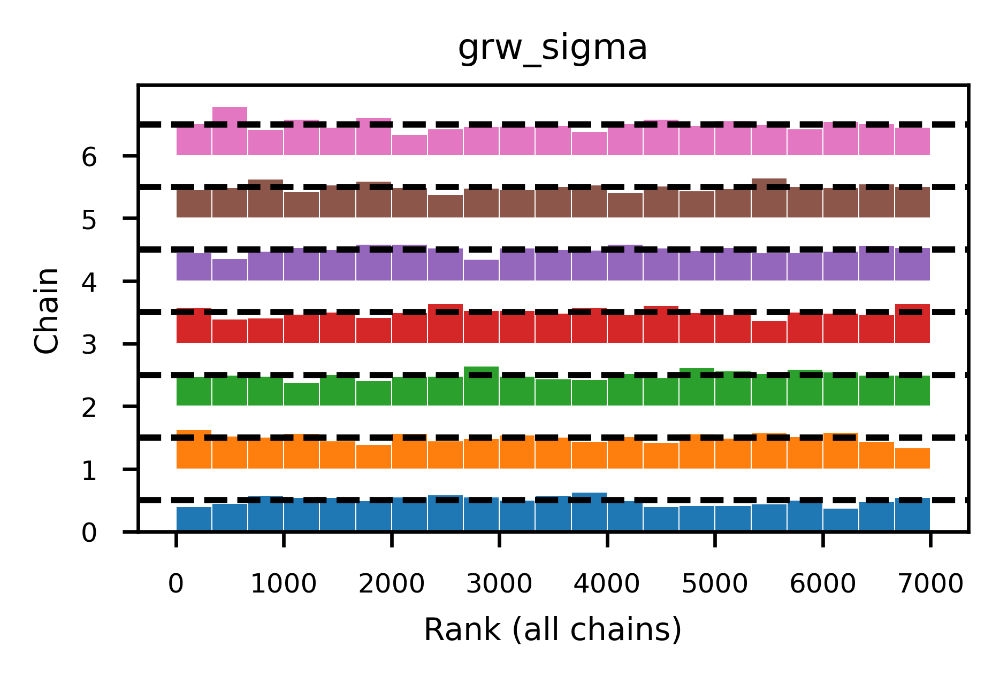</p>
</div></td>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="50.0%" data-layout-align="left">
<p>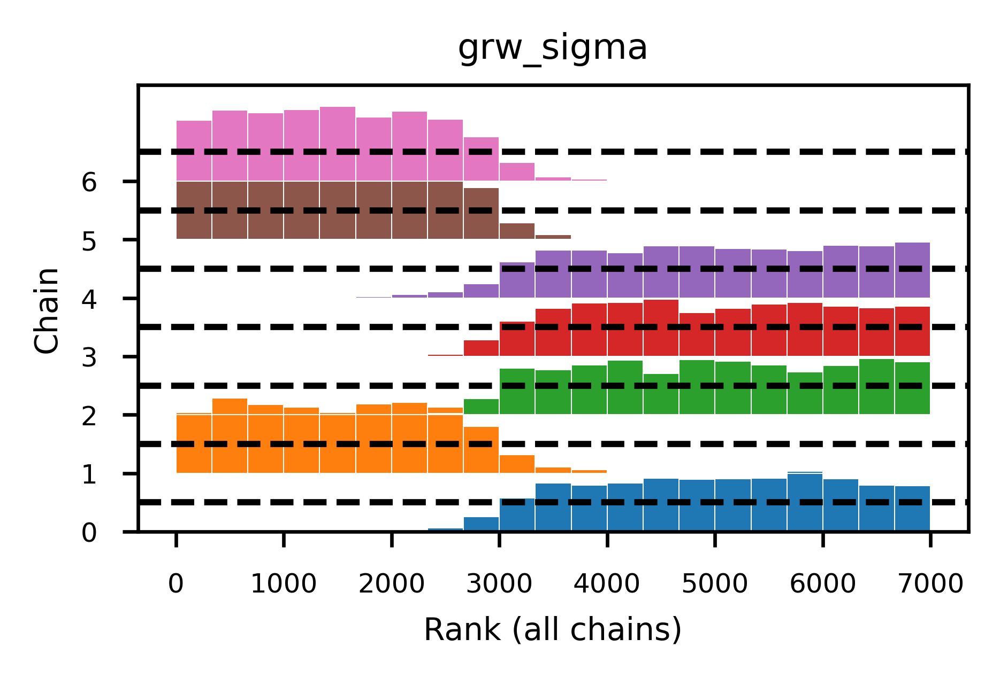</p>
</div></td>
</tr>
</tbody>
</table>

Rank plots for the grw_sigma parameter in the two NNHN models fitted to chr8 in X- and Y-bearing sperm at 10kb resolution.

As a last resort, I returned to the parameter sweep and selected another ‘good’ configuration. In this setup, the GRW innovations were modeled with a Student-T distribution with 10 degrees of freedom, providing a heavier-tailed alternative to the Normal distribution that allows occasional large steps. This change produced the opposite outcome: the X-bearing sperm model exhibited poor mixing and many divergences, while the Y-bearing sperm model mixed successfully (*data not shown*).

#### GRW Innovations and Mixing Behavior

Modeling the GRW innovations with a Student-T distribution ($\nu=10$) introduces heavier tails compared to the Normal distribution, allowing occasional large steps. This adjustment improved mixing for the noisier Y-bearing sperm E1 track, but caused poor mixing for the X-bearing sperm track.

The effect occurs because the X-bearing data are less noisy: the heavy-tailed innovations produce extreme step proposals that create multimodality or steep posterior regions, which the NUTS sampler struggles to explore. Conversely, the Y-bearing data benefit from the heavier tails, which allow the sampler to traverse occasional large GRW steps without getting trapped.

#### Mitigation for future analysis

To balance robustness and sampling stability, we could try lightening the tails for the Student-T GRW innovations ($\nu > 10$). Additionally, adaptive prior scaling for `grw_sigma` could help account for differences in data noise, preventing extreme latent steps in cleaner datasets or higher resolutions. Finally, monitoring rank plots and posterior predictive checks for all datasets ensures that heavy-tailed innovations improve sampler performance without introducing spurious modes.

#### Credible intervals

As previously, the mixing weight trace was evaluated, and the credible intervals were extracted as well. Here, the credible intervals for the Y-model (not properly mixing) were very wide as expected (@fig-chr8-compare-w-credible-intervals). To visualize how the extra mode affects the trace, a subset of the full posterior curve for the mixing weight `w` was plotted for each chain (@fig-chr8-compare-w-raw-curves), showing two distinct paths along the chromosome. Here, the red curve (chain 0,2,3,4 inferred from the rank plot) closely resembles the trace of the X-model. That means we could mask the chains that do not mix until we have experimented further with initializing the random variables. Although it is not the optimal scientific practice, it allows us to move on.

``` python
matplotlib_inline.backend_inline.set_matplotlib_formats("png", dpi=600)

for name, w_stack in w_vars.items():
    if "T" in name:
        continue
    # print(f"Model: {name}, non-empty bins: {w_stack.pos.size}")   
    w_mean = w_stack.mean(dim=('sample'))
    w_ci_direct = w_stack.quantile([0.05, 0.95], dim=("sample"))
    w_ci_upper_direct = w_ci_direct.sel(quantile=0.05)
    w_ci_lower_direct = w_ci_direct.sel(quantile=0.95)

    x = w_stack["pos"]

    f, ax = plt.subplots()

    ax.fill_between(
        x,
        w_ci_lower_direct,
        w_ci_upper_direct,
        alpha=0.3,
        label="95% CI",
        color="blue",
        ec='None'
    )

    x_grey = x.copy()
    x_grey = x_grey.where(
        ~((w_mean < 1/3) | (w_mean > 2/3)),
        np.nan
    )

    # Grey band
    ax.fill_between(
        x, 
        0,
        1,
        where=x_grey.notnull(),
        alpha=0.1,
        color='gray')

    # # Compare e1 predictions
    e1 = traces[name].observed_data.y_hat.values
    hard_assign =  e1 > 0

    ax.plot(x, w_mean, label="Posterior mean", color="black", linewidth=0.3)

    ax.scatter(x, hard_assign, label="ICE TYPE 10kb", color="green", linewidth=0.5, alpha=0.015)

    # Plot the 0.5 line
    ax.hlines([0.66, 0.33], min(x), max(x), color="red", linestyle="--", linewidth=0.7)

    plt.ylabel("P(z=1)")
    plt.xlabel("Location")
    plt.legend(loc='upper left')
    # plt.title("Posterior Probability with Raw Mixing Weight CI")
    # 
    plt.show()


```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>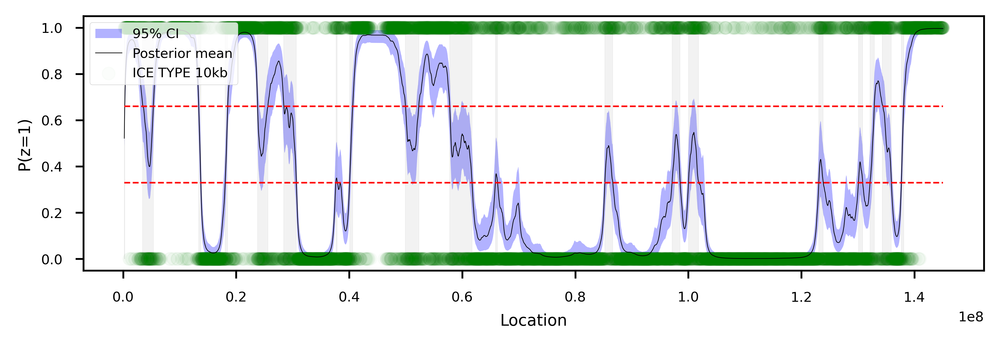</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>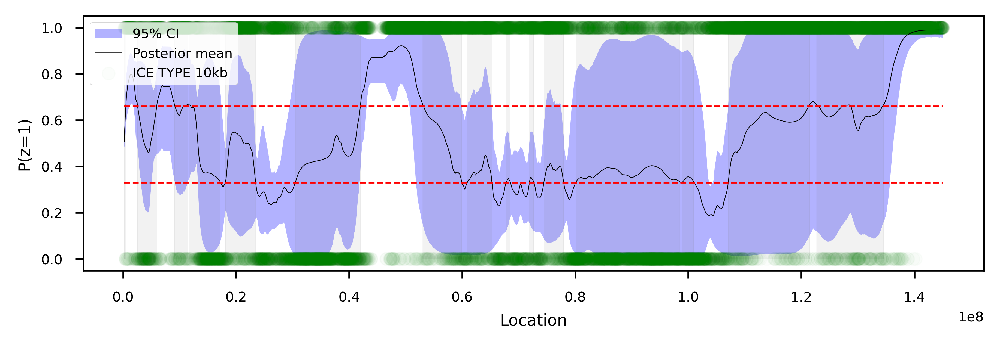</p>
</div></td>
</tr>
</tbody>
</table>

Posterior mixing weights with 95% credible intervals for the four models fitted to chr8 in X- and Y-bearing sperm at 10kb resolution. The grey band indicates regions where the posterior mean is between 0.33 and 0.66, i.e., uncertain compartment assignment.

``` python
# Plot the all posterior samples of `w` in a single plot
# but start out with a smaller subset
# set the inline display to low dpi
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('png', dpi=150)
import matplotlib.lines as mlines

for name, w_stack in w_vars.items():
    if "T" in name:
        continue
    x = w_stack["pos"]
    w_mean = w_stack.mean(dim=('sample'))
    total_points = 15_000_000
    n_curves = total_points // len(x)
    n_chains = np.unique(w_stack.chain).shape[0]
    # Subset ncurves // nchains from each chain
    w_subset = w_stack.sel(draw=slice(0,n_curves//n_chains))

    # Example: chain colors
    unique_chains = np.unique(w_subset.chain)
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_chains)))
    chain_to_color = {c: colors[i] for i, c in enumerate(unique_chains)}

    fig, ax = plt.subplots()

    # Plot lines with alpha < 1
    for chain_id in unique_chains:
        cols = np.where(w_subset.chain == chain_id)[0]
        for i in cols:
            ax.plot(x, w_subset[:, i], color=chain_to_color[chain_id], alpha=0.05, linewidth=0.05)

    # Create custom legend handles with alpha=1
    handles = [mlines.Line2D([], [], color=chain_to_color[c], label=f'Chain {c}', alpha=1) 
            for c in unique_chains]

    ax.legend(handles=handles, loc="upper right")

    # Grey band

    x_grey = x.where(
        ~((w_mean < 1/3) | (w_mean > 2/3)),
        np.nan
    )

    ax.fill_between(
        x, 
        0,
        1,
        where=x_grey.notnull(),
        alpha=0.1,
        color='gray')

    ax.hlines([0.66, 0.33], min(x), max(x), color="red", linestyle="--", linewidth=0.3)
    ax.set_ylabel("w")
    ax.set_xlim(0, x.max()+2e7)

    #plt.title(f"{name} Posterior Samples of Mixing Weights (n = {w_subset.shape[1]})")
    # 
    plt.show()

```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>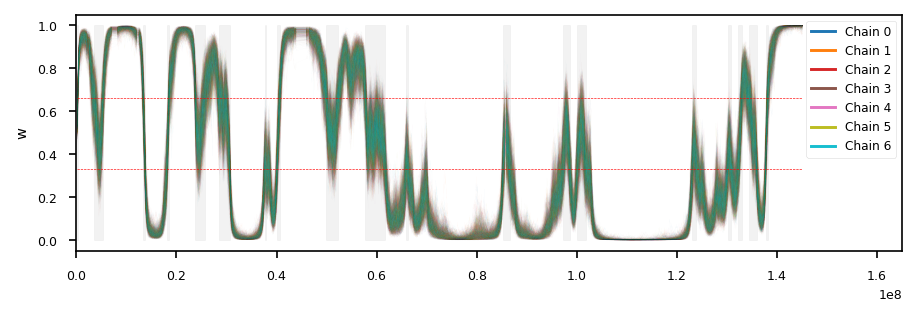</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>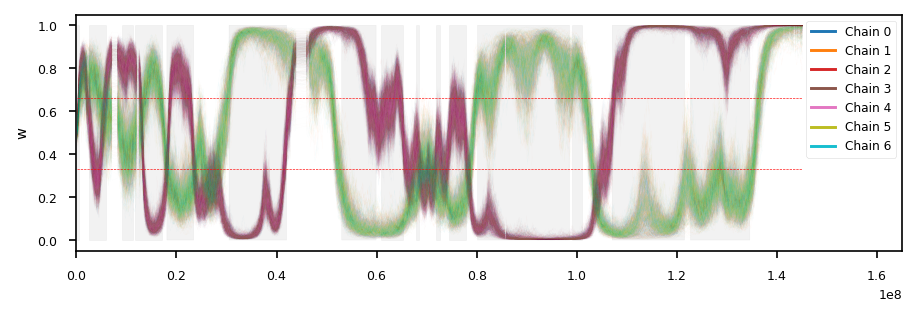</p>
</div></td>
</tr>
</tbody>
</table>

Posterior samples of the mixing weights for the four models fitted to chr8 in X- and Y-bearing sperm at 10kb resolution. We plot a subset from each chain to avoid crashing the IPyKernel.

The uncertainty in mixing weight was converted to positional uncertainty as above, by counting the crossings in each bin and making a histogram of the crosses in each direction. By visual inspection, the CI-based transition zones are largely unique between the two sets, supporting the hypothesis that the chromosomal architecture is highly affected by the sex chromosome it carries. Assuming this model holds up to further testing, the next interesting thing to analyze is specific genomic regions of interest that are hypothesized to affect the viability or development of sperm cells.

``` python
# Process all traces and save results in a dictionary
processed_data = {name: process_trace(name, trace, threshold=0.5) for name, trace in traces.items()}


# Plot results for a specific trace
for name, processed in processed_data.items():
    if "T" in name:
        continue
    # print(f"Plotting results for {name}")
    # display( processed["df_summarised"] )
    plot_trace_results(processed, bin_size=500_000)
    
```

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>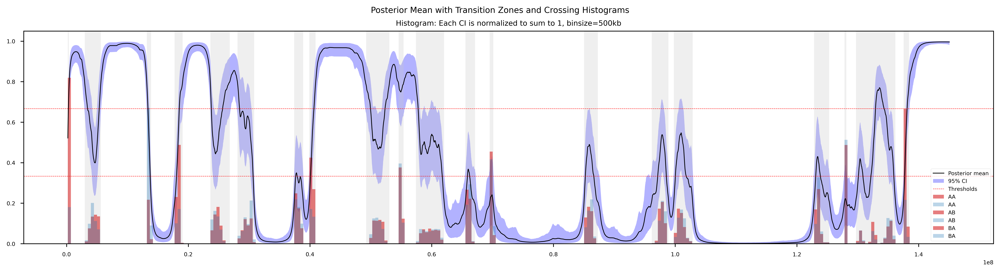</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 100%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div class="cell-output cell-output-display" width="100.0%" data-layout-align="left">
<p>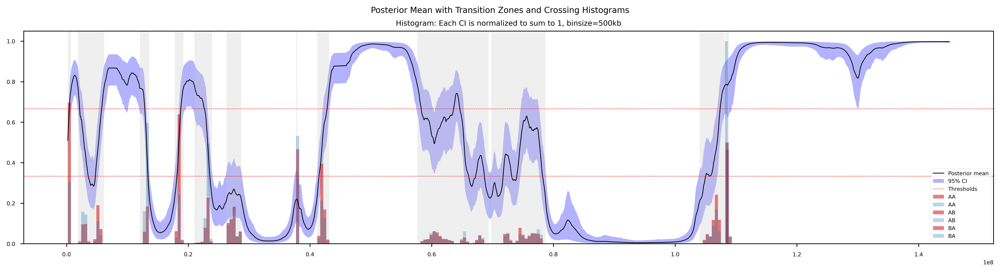</p>
</div></td>
</tr>
</tbody>
</table>

Posterior mean of the mixing weights with 95% credible intervals, transition zones, and crossing histograms for the two NNHN models fitted to chr8 in X- and Y-bearing sperm at 10kb resolution.

# Conclusive Discussion

As there is no way of knowing if the model estimates are closer to reality than the compartments assigned by the classical analysis, as stated in @kalluchi2023considerationscaveatsanalyzing, one general problem with the modeling of chromatin 3D-architecture is that PCA (or ICE) is used as ground truth. This means that *whatever* analysis we do *on* the eigenvectors, it will deviate from the conventional ground truth. However, while we cannot determine *if* we get closer to reality, we can still *use* it as such. Additionally, even if we get the same compartment predictions as with ICE, we have also generated a full posterior distribution of each eigenvector, meaning we can use probabilistics to determine credible intervals, and thus assign less arbitrary transition zones than would otherwise be possible. Moreover, this method could be a way to gain a more precise estimate of compartment borders when using higher resolution matrices than is viable with the classical Hi-C analysis.

Although not fully tried and tested, this study provides the initial steps towards a probabilistic modeling of the chromatin compartment calls, providing a baseline architecture that is still subject to parameter tuning. Additionally, we have still not addressed the limitations to the magnitude of the eigenvectors themselves, and it should be investigated in a separate study, possibly by factoring in different known correlations along the genome.

# References